# Automatyczna klasyfikacja stanu opon samochodowych przy użyciu technik głębokiego uczenia

## Poczatkowe ustawienia

### Google Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Definicja styli


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the style directly using seaborn
sns.set_theme(style='darkgrid')  # Base style

# Define custom modifications
plt.rcParams['axes.titlesize'] = 14  # Title size
plt.rcParams['axes.labelsize'] = 12  # Axis label size
plt.rcParams['xtick.labelsize'] = 10  # X tick label size
plt.rcParams['ytick.labelsize'] = 10  # Y tick label size
plt.rcParams['axes.edgecolor'] = 'gray'  # Axis edge color
plt.rcParams['axes.facecolor'] = 'white'  # Background color

### Dane

 W ramach projektu skorzystano z dwóch ogólnodostępnych zbiorów danych, które są jedynymi, do których udało się uzyskać dostęp w kontekście tego badania.

1. **Kaggle Tyre Quality Classification** - https://www.kaggle.com/datasets/warcoder/tyre-quality-classification/code
2. **Mendeley Data Tyre Dataset** - https://data.mendeley.com/datasets/32b5vfj6tc/


In [ ]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

path_to_kaggle_data = '/content/drive/My Drive/Magisterka/Data/Kaggle Dataset/'
path_to_mendeley_data = '/content/drive/My Drive/Magisterka/Data/TyreDataset_Mendeley/'
output_folder = '/content/drive/My Drive/Magisterka/ResearchData/'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

## Analiza zbioru danych

### Podstawowe informacje o zbiorach danych

In [ ]:
import os
import hashlib
from PIL import Image
from pathlib import Path
import random
import matplotlib.pyplot as plt

In [ ]:
import os
from PIL import Image

def analyze_dataset(path, categories=['good', 'defective']):
    """Analyzes dataset for given categories to gather various image properties."""
    data_info = {
        'total_images': 0,
        'square_images': 0,
        'grayscale_images': 0,
        'unique_sizes': set(),
        'non_square_sizes': set(),  # Set to hold non-square image sizes
        'category_counts': {category: 0 for category in categories},
        'defective_count': 0,
        'total_width': 0,
        'total_height': 0,
        'file_sizes': [],
    }

    for category in categories:
        category_path = os.path.join(path, category)
        images = os.listdir(category_path)
        data_info['category_counts'][category] = len(images)
        data_info['total_images'] += len(images)

        if category == 'defective':
            data_info['defective_count'] += len(images)

        for image_name in images:
            image_path = os.path.join(category_path, image_name)
            try:
                with Image.open(image_path) as img:
                    size = img.size
                    data_info['unique_sizes'].add(size)
                    if size[0] == size[1]:
                        data_info['square_images'] += 1
                    else:
                        data_info['non_square_sizes'].add(size)

                    if img.mode == 'L':
                        data_info['grayscale_images'] += 1

                    data_info['total_width'] += size[0]
                    data_info['total_height'] += size[1]

                    aspect_ratio = round(size[0] / size[1], 2)
                    if 'aspect_ratios' not in data_info:
                        data_info['aspect_ratios'] = {}
                    if aspect_ratio in data_info['aspect_ratios']:
                        data_info['aspect_ratios'][aspect_ratio] += 1
                    else:
                        data_info['aspect_ratios'][aspect_ratio] = 1

                    file_size_kb = os.path.getsize(image_path) / 1024  # KB
                    data_info['file_sizes'].append(file_size_kb)
            except Exception as e:
                print(f"Error processing image {image_path}: {e}")

    if data_info['total_images'] > 0:
        data_info['defective_percentage'] = (data_info['defective_count'] / data_info['total_images']) * 100
    else:
        data_info['defective_percentage'] = 0

    if data_info['total_images'] > 0:
        data_info['average_width'] = data_info['total_width'] / data_info['total_images']
        data_info['average_height'] = data_info['total_height'] / data_info['total_images']
    else:
        data_info['average_width'] = 0
        data_info['average_height'] = 0

    if data_info['file_sizes']:
        data_info['average_file_size'] = sum(data_info['file_sizes']) / len(data_info['file_sizes'])
    else:
        data_info['average_file_size'] = 0

    return data_info

def display_dataset_info(data_info, dataset_name):
    """Displays collected dataset information."""
    print(f"Informacje o zbiorze danych {dataset_name}:")
    print(f"  Łączna liczba obrazów: {data_info['total_images']}")
    for category, count in data_info['category_counts'].items():
        print(f"  Liczba obrazów w kategorii '{category}': {count}")
    print(f"  Liczba obrazów kwadratowych: {data_info['square_images']}")
    print(f"  Liczba obrazów w skali szarości: {data_info['grayscale_images']}")
    print(f"  Unikalne rozmiary obrazów: {data_info['unique_sizes']}")
    print(f"  Rozmiary obrazów niekwadratowych: {data_info['non_square_sizes']}")
    print(f"  Procent uszkodzonych obrazów: {data_info.get('defective_percentage', 0):.2f}%")
    print(f"  Średnia szerokość obrazów: {data_info.get('average_width', 0):.2f} pikseli")
    print(f"  Średnia wysokość obrazów: {data_info.get('average_height', 0):.2f} pikseli")
    print(f"  Rozkład proporcji (Aspect Ratios): {data_info.get('aspect_ratios', {})}")
    print(f"  Średni rozmiar pliku: {data_info.get('average_file_size', 0):.2f} KB")


In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import matplotlib.patches as patches

def display_random_images(
    dataset_path,
    num_images=12,
    nrows=3,
    ncols=4,
    target_size=(300, 300),
    padding_color=(255, 255, 255),
    border_color='black',
    border_width=2,
    label_bg_color=(0, 0, 0, 0.6),
    label_text_color='white',
    label_fontsize=16
):
    """
    Displays random images with labels overlaid on them with a full-width semi-transparent background
    at the bottom of each image. All images are scaled to a uniform size while maintaining aspect ratios
    without cropping. Additionally, a border is added around each image, and padding fills any remaining
    space.

    :param dataset_path: Path to the dataset folder containing 'good' and 'defective' subdirectories.
    :param num_images: Number of images to display. Default is 12.
    :param nrows: Number of rows in the subplot grid. Default is 3.
    :param ncols: Number of columns in the subplot grid. Default is 4.
    :param target_size: Tuple (width, height) in pixels to scale images. Default is (300, 300).
    :param padding_color: Background color for padding as a tuple (R, G, B). Default is white (255, 255, 255).
    :param border_color: Color of the border around each image. Default is 'black'.
    :param border_width: Width of the border in pixels. Default is 2.
    :param label_bg_color: Background color for the label in RGBA format. Default is semi-transparent black (0, 0, 0, 0.6).
    :param label_text_color: Color of the label text. Default is 'white'.
    :param label_fontsize: Font size of the label text. Default is 16.
    """
    # Define the categories and their corresponding labels
    categories = {
        'good': 'Sprawna',
        'defective': 'Wadliwa'
    }

    # Prepare paths for each category
    category_paths = {category: os.path.join(dataset_path, category) for category in categories}

    # Collect all image file paths from each category
    all_images = []
    for category, path in category_paths.items():
        if not os.path.isdir(path):
            print(f"Warning: Directory '{path}' does not exist. Skipping this category.")
            continue
        # List all files in the category directory
        category_images = [
            os.path.join(path, f) for f in os.listdir(path)
            if os.path.isfile(os.path.join(path, f))
        ]
        all_images.extend(category_images)

    if not all_images:
        print("Error: No images found in the specified dataset path.")
        return

    # Shuffle the combined list of images
    random.shuffle(all_images)

    # Select a random sample of images
    selected_images = random.sample(all_images, min(num_images, len(all_images)))

    # Set up the plot with specified number of rows and columns
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 3, nrows * 3))
    axes = axes.ravel()  # Flatten the axes array for easy iteration

    for i, image_path in enumerate(selected_images):
        try:
            # Open and convert the image to RGB
            img = Image.open(image_path).convert("RGB")

            # Scale the image while maintaining aspect ratio
            if hasattr(Image, 'Resampling'):
                resample_method = Image.Resampling.LANCZOS
            else:
                resample_method = Image.LANCZOS  # For older Pillow versions
            img.thumbnail(target_size, resample_method)

            # Create a new image with padding
            new_img = Image.new("RGB", target_size, padding_color)
            # Calculate position to paste the scaled image to center it
            paste_position = (
                (target_size[0] - img.width) // 2,
                (target_size[1] - img.height) // 2
            )
            new_img.paste(img, paste_position)

            # Determine the label based on the category
            label = "Sprawna" if 'good' in image_path.lower() else "Wadliwa"

            # Display the image
            axes[i].imshow(new_img)
            axes[i].axis('off')  # Hide axis ticks and labels

            # Add a semi-transparent rectangle as background for the label
            axes[i].add_patch(
                patches.Rectangle(
                    (0, 0), 1, 0.12,  # Position and size in axis coordinates
                    color=label_bg_color,  # Background color with transparency
                    transform=axes[i].transAxes,  # Use axis coordinates
                    zorder=1000  # Draw below the text
                )
            )

            # Add the label text on top of the semi-transparent background
            axes[i].text(
                0.5, 0.06, label,  # Position in axis coordinates
                fontsize=label_fontsize,
                color=label_text_color,
                weight='bold',
                ha='center',
                va='center',
                transform=axes[i].transAxes,  # Use axis coordinates
                zorder=1001  # Draw above the rectangle
            )

            # Add a border around the image
            axes[i].add_patch(
                patches.Rectangle(
                    (0, 0), 1, 1,  # Position and size in axis coordinates
                    linewidth=border_width,
                    edgecolor=border_color,
                    facecolor='none',  # No fill color
                    transform=axes[i].transAxes,  # Use axis coordinates
                    zorder=1002  # Draw above everything else
                )
            )

        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            axes[i].axis('off')  # Hide the subplot if image loading fails
            continue

    # Hide any unused subplots
    for j in range(len(selected_images), nrows * ncols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
# Analyze datasets
kaggle_data_info = analyze_dataset(path_to_kaggle_data)
mendeley_data_info = analyze_dataset(path_to_mendeley_data)

# Display dataset information
display_dataset_info(kaggle_data_info, "Kaggle")
print("\n")
display_dataset_info(mendeley_data_info, "Mendeley")

#### Przykładowe zdjęcia opon w poszczególnych zbiorach

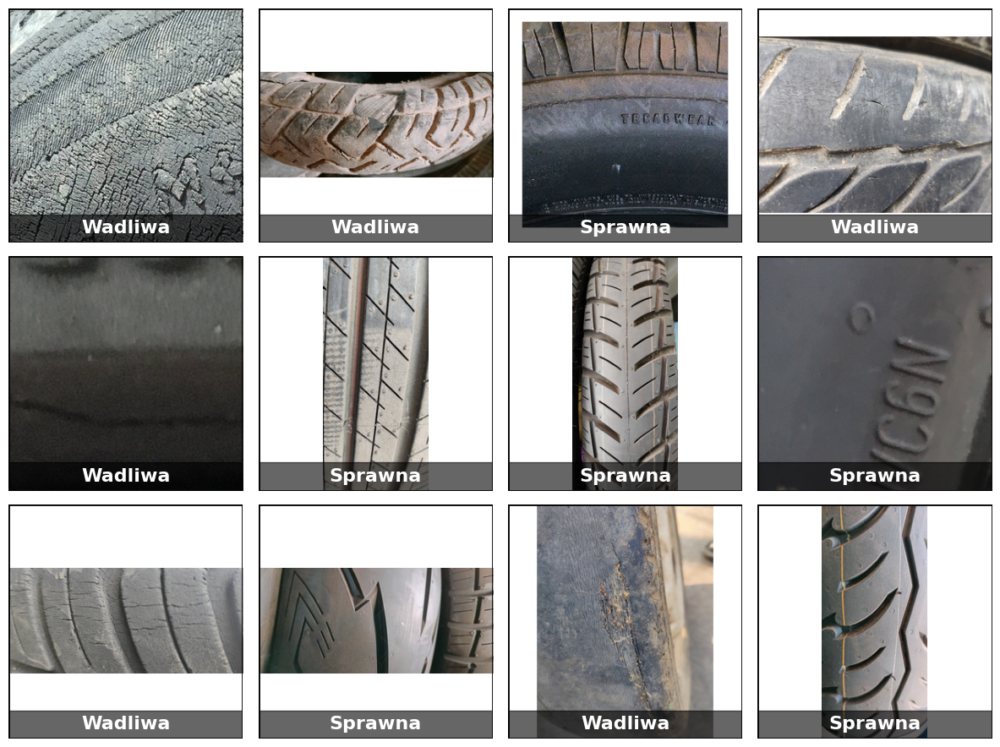

In [ ]:
display_random_images(dataset_path=path_to_kaggle_data)

In [ ]:
display_random_images(path_to_mendeley_data)

#### Sprawdzenie czy istnieją duplikaty

In [ ]:
# Function to compute the hash of an image file
def get_image_hash(image):
    """Compute the MD5 hash for an image."""
    md5 = hashlib.md5()
    md5.update(image.tobytes())
    return md5.hexdigest()

# Function to find duplicates in directories
def find_duplicates(base_path):
    """Walk through directories to find duplicate images."""
    hashes = {}  # Dictionary to hold the hashes of the images
    file_counter = 0  # Counter to track number of files processed
    duplicate_pairs = []  # List to store pairs of duplicate images

    for dirpath, dirnames, filenames in os.walk(base_path):
        for filename in filenames:
            # Process only JPEG and PNG images
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(dirpath, filename)
                with Image.open(image_path) as image:
                    image_hash = get_image_hash(image)

                    # Add the image path to the corresponding hash entry in the dictionary
                    if image_hash in hashes:
                        hashes[image_hash].append(image_path)
                    else:
                        hashes[image_hash] = [image_path]
                file_counter += 1

    # Check for duplicates
    for image_list in hashes.values():
        if len(image_list) > 1:
            for i in range(len(image_list)):
                for j in range(i + 1, len(image_list)):
                    duplicate_pairs.append((image_list[i], image_list[j]))

    return file_counter, duplicate_pairs

In [ ]:
base_path = Path("/content/drive/My Drive/Magisterka/Data")
total_images, duplicates = find_duplicates(base_path)

print(f"Przetworzono łącznie {total_images} obrazów.")
if duplicates:
    print(f"Znaleziono {len(duplicates)} par duplikatów obrazów.")
    print("Znalezione pary duplikatów:")
    for pair in duplicates:
        print(pair)

### Konsolidacja Danych i Usuwanie Duplikatów

In [ ]:
import os
import shutil
from PIL import Image
from pathlib import Path

def merge_datasets(source_paths, output_folder, categories=['good', 'defective']):
    """
    Merges datasets from different sources, removes duplicates, and saves the results with source labels.

    Parameters:
    - source_paths: List of tuples [(path1, label1), (path2, label2), ...]
    - output_folder: Path to the output directory
    - categories: List of category names
    """
    # Ensure the output directory exists
    output_folder = Path(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)

    seen_images = set()  # Set to track seen (non-duplicate) images
    image_count = 0  # Counter for total images processed

    # Process each category
    for category in categories:
        category_folder = output_folder / category
        category_folder.mkdir(exist_ok=True)

        for source_path, label in source_paths:
            category_path = Path(source_path) / category
            if not category_path.exists():
                print(f"Ścieżka {category_path} nie istnieje. Pomijam.")
                continue

            for image_name in os.listdir(category_path):
                image_path = category_path / image_name
                if not image_path.is_file():
                    continue

                try:
                    with Image.open(image_path) as img:
                        img_hash = get_image_hash(img)
                except Exception as e:
                    print(f"Nie można otworzyć obrazu {image_path}: {e}")
                    continue

                if img_hash not in seen_images:
                    seen_images.add(img_hash)
                    name, ext = os.path.splitext(image_name)
                    new_image_name = f"{name}_{label}{ext}"
                    target_path = category_folder / new_image_name

                    if target_path.exists():
                        unique_id = hashlib.md5(os.urandom(16)).hexdigest()[:8]
                        new_image_name = f"{name}_{label}_{unique_id}{ext}"
                        target_path = category_folder / new_image_name

                    shutil.copy2(image_path, target_path)
                    image_count += 1

    print(f"Łączna liczba zapisanych unikalnych obrazów: {image_count}")

In [ ]:
merge_datasets(
    source_paths=[
        (path_to_kaggle_data, 'kaggle'),
        (path_to_mendeley_data, 'mendeley')
    ],
    output_folder=output_folder
)

### Postawowe informacje o docelowym zbiorze badawczym

In [ ]:
# Path to the research dataset folder
research_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'

In [ ]:
research_data_info = analyze_dataset(research_dataset_path)

# Display dataset information
display_dataset_info(research_data_info, "Research Dataset")

W badanym zbiorze danych znajduje się 226 różnych wymiarów zdjęć, z których najczęstszym jest 2250x2250. Wśród obrazów występują zarówno formaty kwadratowe jak i prostokątne

#### Rozkład klas

In [ ]:
import plotly.express as px

def display_category_proportions(data_info):
    categories = ['Poprawne', 'Wadliwe']
    counts = [data_info['category_counts'][category] for category in ['good', 'defective']]
    total = sum(counts)
    percentages = [(count / total * 100) for count in counts]

    # Using Plotly Express to create a horizontal bar chart
    fig = px.bar(
        x=percentages,
        y=categories,
        text_auto=".1f",  # Display one decimal place
        orientation='h',  # Horizontal bar chart
        title="Rozkład jakości opon w zbiorze badawczym",
        color_discrete_sequence=["#3B3B6D"],  # Matching the dark blue color used earlier
        height=280,
        width=840
    )
    # Updating the chart layout and styles
    fig.update_xaxes(title="Procentowy udział", range=[-1, 65])
    fig.update_yaxes(title="")
    fig.update_traces(textposition='outside')
    fig.update_layout(
        font=dict(
            family="Arial",  # Consistent font family
            size=12,  # Adjust font size for readability
            color="black"  # Ensuring text is easy to read
        ),
        title_font=dict(
            family="Arial",
            size=18,
            color="black"
        ),
        plot_bgcolor="white",  # Background color for the plot area
        paper_bgcolor="white",  # Background color outside the plot area
        xaxis_showgrid=False,  # Removing grid lines for a clean look
        yaxis_showgrid=False,
        bargap=0.4,  # Adjusting the gap between bars
        title_x=0.5  # Centering the title
    )
    fig.show()

# Display the category proportions
display_category_proportions(research_data_info)

Rozkład klas w zbiorze danych to 47% dla klasy 'Dobre' i 53% dla klasy 'Wadliwe', co jest stosunkowo zrównoważone dla potrzeb klasyfikacji binarnej. Taka dystrybucja nie wymaga specjalnych technik przetwarzania wstępnego, które są potrzebne w przypadkach bardziej ekstremalnego niezrównoważenia klas. Standardowe algorytmy uczenia maszynowego powinny efektywnie radzić sobie z takim rozkładem.

#### Przykładowe zdjęcia

In [ ]:
display_random_images(research_dataset_path)

In [ ]:
display_random_images(research_dataset_path)

#### Wymiary zdjęć


In [ ]:
def get_image_dimensions(path, categories=['good', 'defective']):
    dimensions = {'good': [], 'defective': []}

    for category in categories:
        category_path = os.path.join(path, category)
        images = os.listdir(category_path)

        for image_name in images:
            image_path = os.path.join(category_path, image_name)
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
                    dimensions[category].append((width, height))
            except Exception as e:
                print(f"Error processing image {image_path}: {e}")

    return dimensions


In [ ]:
def plot_tire_image_dimensions(dimensions):
    """Plots the width and height of tire images (good as 'Sprawnych', defective as 'Wadliwych')."""

    for category, dims in dimensions.items():
        if dims:
            # Separate widths and heights from dimensions
            widths, heights = zip(*dims)
            plt.figure(figsize=(10, 6))

            # Use 'x' as the marker and increase transparency
            plt.scatter(widths, heights, label=f'{category.capitalize()}', alpha=0.8, marker='x', s=50, color='blue')

            # Title with Polish names for categories and pixel unit
            if category == 'good':
                plt.title('Wymiary zdjęć opon sprawnych w pikselach')
            else:
                plt.title('Wymiary zdjęć opon wadliwych w pikselach')

            # Label axes
            plt.xlabel('Szerokość (Width)')
            plt.ylabel('Wysokość (Height)')

            # More visible grid with dashed lines
            plt.grid(True, linestyle='--', alpha=0.6)

            # Show legend and plot
            plt.legend()
            plt.show()
        else:
            print(f"No data available for category: {category}")


In [ ]:
dimensions = get_image_dimensions(research_dataset_path)

In [ ]:
plot_tire_image_dimensions(dimensions)

In [ ]:
def plot_boxplot_image_dimensions(dimensions):
    """Plots box plots for width and height of tire images for good and defective categories with custom styling."""

    for category, dims in dimensions.items():
        if dims:
            # Separate widths and heights
            widths, heights = zip(*dims)
            plt.figure(figsize=(10, 6))

            # Create box plot for width and height
            plt.boxplot([widths, heights], labels=['Szerokość (Width)', 'Wysokość (Height)'], patch_artist=True,
                        boxprops=dict(facecolor='lightblue', color='blue'),  # Color styling for the box
                        medianprops=dict(color='red'),  # Color for the median line
                        whiskerprops=dict(color='blue'),  # Color for whiskers
                        capprops=dict(color='blue'),  # Color for caps
                        flierprops=dict(marker='o', color='red', markersize=8, alpha=0.5))  # Outliers styling

            # Title with Polish names for categories
            if category == 'good':
                plt.title('Rozkład szerokości i wysokości zdjęć opon sprawnych w pikselach')
            else:
                plt.title('Rozkład szerokości i wysokości zdjęć opon wadliwych w pikselach')

            # Labels for the axes
            plt.xlabel('Rodzaj wymiaru')
            plt.ylabel('Wymiary w pikselach')

            # Add a more visible grid
            plt.grid(True, linestyle='--', alpha=0.6)

            # Show plot
            plt.show()
        else:
            print(f"No data available for category: {category}")


In [ ]:
plot_boxplot_image_dimensions(dimensions)

Wnioski:
* Podobieństwa w rozkładach: Mediany oraz zakresy dla szerokości i wysokości obrazów opon sprawnych i wadliwych są zbliżone
* Brak istotnych różnic w wymiarach obrazów między klasami

#### Rozkład kolorów w obrazach

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_color_distribution_by_category(dataset_path, categories=['good', 'defective']):
    """Plots the average color distribution for 'good' and 'defective' images in separate plots."""

    for category in categories:
        hist_r = np.zeros((256,))
        hist_g = np.zeros((256,))
        hist_b = np.zeros((256,))
        total_images = 0

        category_path = os.path.join(dataset_path, category)
        if not os.path.exists(category_path):
            print(f"Directory not found: {category_path}")
            continue

        # List all image files in the category folder
        image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.png'))]

        # Process each image
        for image_file in image_files:
            image_path = os.path.join(category_path, image_file)
            image = cv2.imread(image_path)

            if image is None:
                print(f"Error loading image: {image_file}")
                continue

            channels = cv2.split(image)  # Split into R, G, B channels

            # Accumulate the histograms for each channel
            hist_b += cv2.calcHist([channels[0]], [0], None, [256], [0, 256]).flatten()
            hist_g += cv2.calcHist([channels[1]], [0], None, [256], [0, 256]).flatten()
            hist_r += cv2.calcHist([channels[2]], [0], None, [256], [0, 256]).flatten()

            total_images += 1

        # Check if any images were processed
        if total_images == 0:
            print(f"No images found in {category_path}")
            continue

        # Normalize the histograms by the number of images
        hist_r /= total_images
        hist_g /= total_images
        hist_b /= total_images

        # Plot the histograms for R, G, B channels for the current category
        plt.figure(figsize=(12, 6))
        plt.plot(hist_b, color='blue', label='Blue')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_r, color='red', label='Red')

        # Add title based on the category
        if category == 'good':
            plt.title('Średni rozkład kolorów w obrazach opon sprawnych (RGB)')
        else:
            plt.title('Średni rozkład kolorów w obrazach opon wadliwych (RGB)')

        # Labels and legend
        plt.xlabel('Wartość koloru (Color Value)')
        plt.ylabel('Średnia liczba pikseli (Average Pixel Count)')
        plt.legend(loc='upper right')
        plt.grid(True, linestyle='--', alpha=0.6)

        # Show the plot for the current category
        plt.show()


In [ ]:
plot_color_distribution_by_category(research_dataset_path)

Wnioski:
* Większość pikseli ma wartości w średnim zakresie (od 50 do 200), co wskazuje na ogólnie ciemne tło i oświetlenie.
* Brak znacznych różnic między kanałami RGB: Rozkład kanałów RGB jest bardzo podobny, co sugeruje, że zdjęcia są praktycznie monochromatyczne. Może to wynikać z charakteru zdjęć opon, które są w dominujących odcieniach szarości i czerni.
* Brak jaskrawych kolorów:

## Wstepne przygotowanie danych

In [ ]:
import os
from PIL import Image
import numpy as np
import shutil

In [ ]:
# Path to the research dataset folder
research_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'

### Weryfikacja poprawnosci danych

In [ ]:
def verify_image_file(image_path):
    """
    Verifies if an image file is valid and not corrupted.
    Returns True if the image is valid, False otherwise.
    """
    try:
        with Image.open(image_path) as img:
            img.verify()  # Verify if image is not corrupted
        return True
    except (IOError, SyntaxError) as e:
        print(f"Corrupted image found: {image_path}. Error: {e}")
        return False


In [ ]:
def clean_corrupted_files(corrupted_files):
    """
    Deletes corrupted image files from the dataset.
    """
    for file_path in corrupted_files:
        try:
            os.remove(file_path)
            print(f"Deleted corrupted file: {file_path}")
        except Exception as e:
            print(f"Error deleting file {file_path}: {e}")

### Zmiana rozmiaru zdjęć


In [ ]:
def resize_image(image, target_size=(224, 224)):
    """
    Resizes the image to the target size.
    """
    # Resize the image
    img_resized = image.resize(target_size)
    return img_resized


In [ ]:
def save_image(image, save_path, image_name):
    """
    Saves  image to the specified save path.
    Ensures that the full directory structure exists.
    """
    try:
        # Ensure that the directory exists (create the full path if necessary)
        os.makedirs(save_path, exist_ok=True)  # Create directories recursively if they don't exist

        # Save the image in the specified path
        image.save(os.path.join(save_path, image_name))  # Save the image
    except Exception as e:
        print(f"Error saving image {image_name} to {save_path}: {e}")

In [ ]:
def resize_and_save_images_in_folder(folder_path, target_folder, target_size=(224, 224)):
    """
    Resizes images and saves them to a new folder structure.
    Also returns stats on how many images were processed and how many were corrupted.
    """
    corrupted_files = []
    processed_count = 0  # Counter for successfully processed images

    for category in ['good', 'defective']:
        category_path = os.path.join(folder_path, category)
        save_category_path = os.path.join(target_folder, category)  # Path to save resized images
        image_files = os.listdir(category_path)

        for image_name in image_files:
            image_path = os.path.join(category_path, image_name)

            # Verify if the image is valid
            if verify_image_file(image_path):
                try:
                    # Open the image
                    with Image.open(image_path) as img:
                        # Resize the image
                        resized_image = resize_image(img, target_size)

                        # Save the resized image to the new folder
                        save_image(resized_image, save_category_path, image_name)
                        processed_count += 1  # Increment counter for successful processing
                except Exception as e:
                    print(f"Error processing image {image_path}: {e}")
            else:
                # Add corrupted files to the list for later handling
                corrupted_files.append(image_path)

    return processed_count, len(corrupted_files)  # Return counts of processed and corrupted files

In [ ]:
# Resize the images and save to the new folder structure
processed_count, corrupted_count = resize_and_save_images_in_folder(research_dataset_path, processed_dataset_path, target_size=(224, 224))

# Print the results
print(f"Number of images successfully processed and saved: {processed_count}")
print(f"Number of corrupted images: {corrupted_count}")

Number of images successfully processed and saved: 3518
Number of corrupted images: 0


## Ładowanie danych, normalizacja, podzial

### Podział zbioru na treningowy, walidacyjny i testowy

In [ ]:
from sklearn.model_selection import train_test_split

def split_dataset(data, labels, test_size=0.15, val_size=0.15, random_state=42, stratify=True):
    """
    Splits the dataset into training, validation, and test sets with an option for stratified label distribution.

    Parameters:
    - data: array-like, input data (images).
    - labels: array-like, labels corresponding to the data.
    - test_size: proportion of the dataset to include in the test set (default is 15%).
    - val_size: proportion of the training set to include in the validation set (default is 15%).
    - random_state: seed for random number generator to ensure reproducibility (default is 42).
    - stratify: Boolean flag to apply stratification (default is True).

    Returns:
    - X_train, X_val, X_test: input data split into training, validation, and test sets.
    - y_train, y_val, y_test: corresponding labels for each split.
    """
    # Ustalanie wartości dla `stratify`
    stratify_labels = labels if stratify else None

    # First split: training+validation vs. test set with optional stratification
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        data, labels, test_size=test_size, random_state=random_state, stratify=stratify_labels
    )

    # Adjust validation size relative to the remaining data
    val_relative_size = val_size / (1 - test_size)

    # Second split: training vs. validation set with optional stratification
    stratify_train_val = y_train_val if stratify else None
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=val_relative_size, random_state=random_state, stratify=stratify_train_val
    )

    return X_train, X_val, X_test, y_train, y_val, y_test

### Normalizacja

In [ ]:
def normalize_image(image):
    """
    Normalizes the pixel values of an image to the range [0, 1].
    """
    # Convert image to NumPy array
    img_array = np.array(image)

    # Normalize pixel values to the range [0, 1]
    img_normalized = img_array / 255.0

    return img_normalized


In [ ]:
import os
import numpy as np
from PIL import Image

def load_data(processed_data_path, normalize=True):
    """
    Loads images from the processed dataset, optionally normalizes them, and returns the data with labels.
    All images are converted to RGB format (3 channels) to ensure consistency.

    Parameters:
    - processed_data_path: Path to the directory containing processed images.
    - normalize: Boolean flag to apply normalization if True (default is True).

    Returns:
    - data: Array of images (optionally normalized).
    - labels: Array of corresponding labels.
    """
    data = []
    labels = []

    for category, label in [('good', 0), ('defective', 1)]:
        category_path = os.path.join(processed_data_path, category)
        image_files = os.listdir(category_path)

        for image_name in image_files:
            image_path = os.path.join(category_path, image_name)

            try:
                with Image.open(image_path) as img:
                    # Convert to RGB to ensure consistency in channels (3 channels)
                    img_rgb = img.convert('RGB')

                    # Normalize the image if requested
                    img_array = normalize_image(img_rgb) if normalize else np.array(img_rgb)

                    # Append the (optionally normalized) image and corresponding label
                    data.append(img_array)
                    labels.append(label)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")

    # Convert lists to NumPy arrays for further processing
    data = np.array(data)
    labels = np.array(labels)

    return data, labels


### Ładowanie danych

In [ ]:
# Load and normalize the data
processed_dataset_path = '/content/drive/My Drive/Magisterka/ProcessedData'
data, labels = load_data(processed_dataset_path, False)

# Print the shape of the data and labels for verification
print(f"Data shape: {data.shape}")
print(f"Labels shape: {labels.shape}")

Data shape: (3518, 224, 224, 3)
Labels shape: (3518,)


In [ ]:
print("Przykładowe wartości z pierwszego obrazu (pierwsze 10 pikseli):", data[0].flatten()[:10])
print("Etykieta pierwszego obrazu:", labels[0])

Przykładowe wartości z pierwszego obrazu (pierwsze 10 pikseli): [60 60 60 64 64 64 66 66 66 64]
Etykieta pierwszego obrazu: 0


In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = split_dataset(data, labels)

In [ ]:
import numpy as np
from collections import Counter

# Liczba przykładów w zbiorach treningowym, walidacyjnym i testowym
print(f"Training set size: {X_train.shape[0]}")
print(f"Validation set size: {X_val.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")

# Liczenie liczby przykładów w każdej klasie dla każdego zbioru
print("\nLiczba przykładów w każdej klasie:")

train_counts = Counter(y_train)
val_counts = Counter(y_val)
test_counts = Counter(y_test)

print("Zbiór treningowy:")
for label, count in train_counts.items():
    print(f"Klasa {label}: {count} przykładów")

print("\nZbiór walidacyjny:")
for label, count in val_counts.items():
    print(f"Klasa {label}: {count} przykładów")

print("\nZbiór testowy:")
for label, count in test_counts.items():
    print(f"Klasa {label}: {count} przykładów")

Training set size: 2462
Validation set size: 528
Test set size: 528

Liczba przykładów w każdej klasie:
Zbiór treningowy:
Klasa 1: 1303 przykładów
Klasa 0: 1159 przykładów

Zbiór walidacyjny:
Klasa 1: 280 przykładów
Klasa 0: 248 przykładów

Zbiór testowy:
Klasa 0: 248 przykładów
Klasa 1: 280 przykładów


## Augmentacja danych

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np
import random

processed_dataset_path = '/content/drive/My Drive/Magisterka/ResearchData'
good_images_path = os.path.join(processed_dataset_path, "good")

In [ ]:
def load_random_image(directory_path, seed=None):
    """
    Function to load a random image from a specified directory.

    Args:
    - directory_path: Path to the directory containing images.
    - seed: Optional seed for reproducibility.

    Returns:
    - A randomly selected image (PIL image).
    """
    # Set the seed for reproducibility if provided
    if seed is not None:
        random.seed(seed)

    # Get a list of all image files in the directory
    image_files = [file for file in os.listdir(directory_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        raise ValueError("No image files found in the directory.")

    # Choose a random image
    random_image_path = os.path.join(directory_path, random.choice(image_files))

    # Load and return the image
    return Image.open(random_image_path)

In [ ]:
random_image = load_random_image(good_images_path, seed=33)

In [ ]:
import matplotlib.pyplot as plt

def visualize_augmentation(original_image, augmented_image, title_original='Oryginalne zdjęcie', title_augmented='Zaugumentowane zdjęcie'):
    """
    Function to visualize the original image alongside its augmented version.
    """
    # Reset to default style
    plt.rcParams.update(plt.rcParamsDefault)

    # Create the figure and axes for side-by-side images
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Plot original image
    ax[0].imshow(original_image)
    ax[0].set_title(title_original, fontsize=14)
    ax[0].tick_params(axis='both', which='both', length=6, color='black')

    # Plot augmented image
    ax[1].imshow(augmented_image)
    ax[1].set_title(title_augmented, fontsize=14)
    ax[1].tick_params(axis='both', which='both', length=6, color='black')

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def visualize_augmented_series(original_image, augmented_images, augmentation_titles):
    """
    Function to visualize a series of augmented images alongside the original with black axes and values.

    Args:
    - original_image: The original image (PIL image or numpy array).
    - augmented_images: List of augmented images.
    - augmentation_titles: List of titles for each augmentation method applied.

    Displays the original image along with several augmented images.
    """
    # Reset to default style
    plt.rcParams.update(plt.rcParamsDefault)

    # Create the figure with a suitable size for multiple images
    fig, axes = plt.subplots(1, len(augmented_images) + 1, figsize=(15, 5))

    # Display the original image with black axes and values
    axes[0].imshow(original_image)
    axes[0].set_title('Oryginalne zdjęcie', fontsize=14)
    axes[0].tick_params(axis='both', which='both', length=6, color='black')

    # Display each augmented image with its title
    for i, (aug_img, title) in enumerate(zip(augmented_images, augmentation_titles), start=1):
        axes[i].imshow(aug_img)
        axes[i].set_title(title, fontsize=14)
        axes[i].tick_params(axis='both', which='both', length=6, color='black')

    # Apply tight layout for better spacing
    plt.tight_layout()
    plt.show()


### Rotacja obrazu


Rotacja obrazu jest jedną z najczęściej stosowanych technik augmentacji danych. Nawet jeśli obrócimy zdjęcie, informacja na obrazie pozostaje taka sama.

In [ ]:
def rotate_image(image, angle, expand=False):
    """
    Function to rotate an image by a given angle, with an optional expand parameter to fit the entire rotated image.

    Args:
    - image: The original image (PIL image).
    - angle: The angle (in degrees) to rotate the image.
    - expand: Whether to expand the output image size to fit the entire rotated image (default: False).

    Returns:
    - The rotated image.
    """
    return image.rotate(angle, expand=expand)

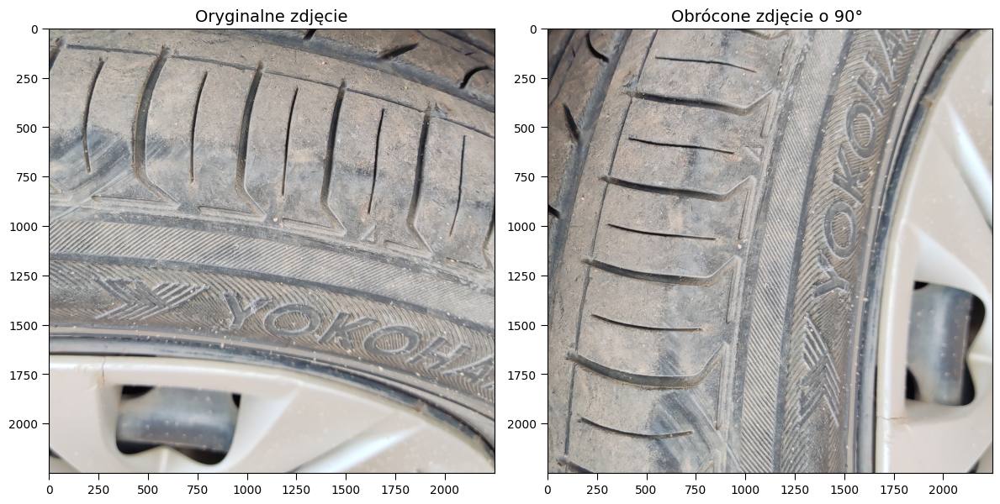

In [ ]:
rotated_image = rotate_image(random_image, 90)

# Visualizing the original and rotated image
visualize_augmentation(random_image, rotated_image, title_original='Oryginalne zdjęcie', title_augmented='Obrócone zdjęcie o 90° ')

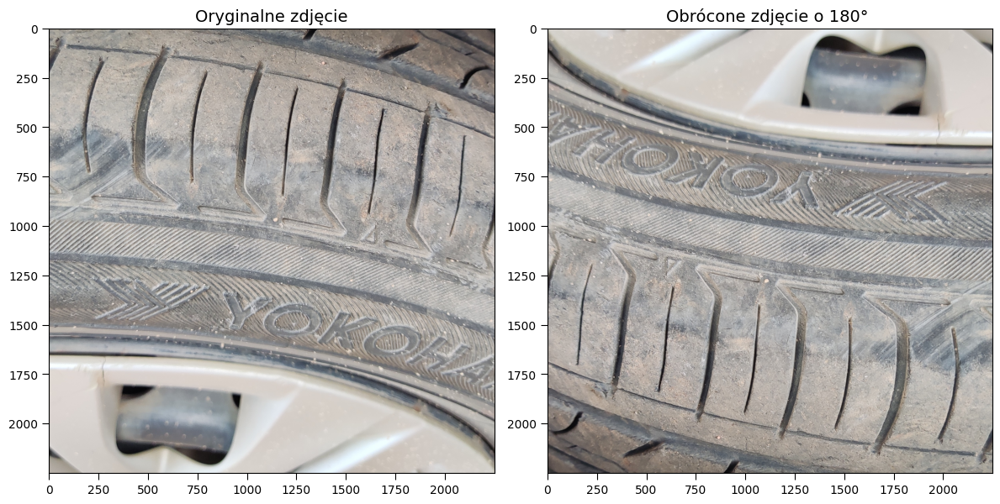

In [ ]:
rotated_image2 = rotate_image(random_image, 180, expand=True)

# Visualizing the original and rotated image
visualize_augmentation(random_image, rotated_image2, title_original='Oryginalne zdjęcie', title_augmented='Obrócone zdjęcie o 180° ')

### Odbicie lustrzane (Flip)

Odbicie lustrzane (poziome lub pionowe) to prosta, ale efektywna metoda augmentacji, szczególnie przy obrazach, gdzie orientacja obiektu nie wpływa na klasyfikację.

In [ ]:
def flip_image(image, horizontal=True):
    """
    Function to flip an image horizontally or vertically.

    Args:
    - image: The original image (PIL image).
    - horizontal: If True, flips the image horizontally; if False, flips it vertically.

    Returns:
    - The flipped image.
    """
    if horizontal:
        return image.transpose(Image.FLIP_LEFT_RIGHT)
    else:
        return image.transpose(Image.FLIP_TOP_BOTTOM)

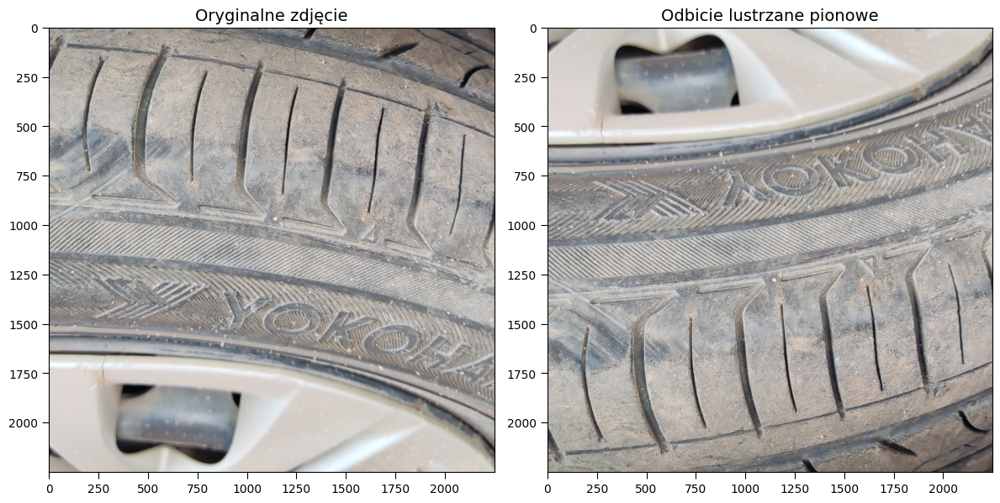

In [ ]:
flipped_image = flip_image(random_image, horizontal=False)
visualize_augmentation(random_image, flipped_image, title_original='Oryginalne zdjęcie', title_augmented='Odbicie lustrzane pionowe')

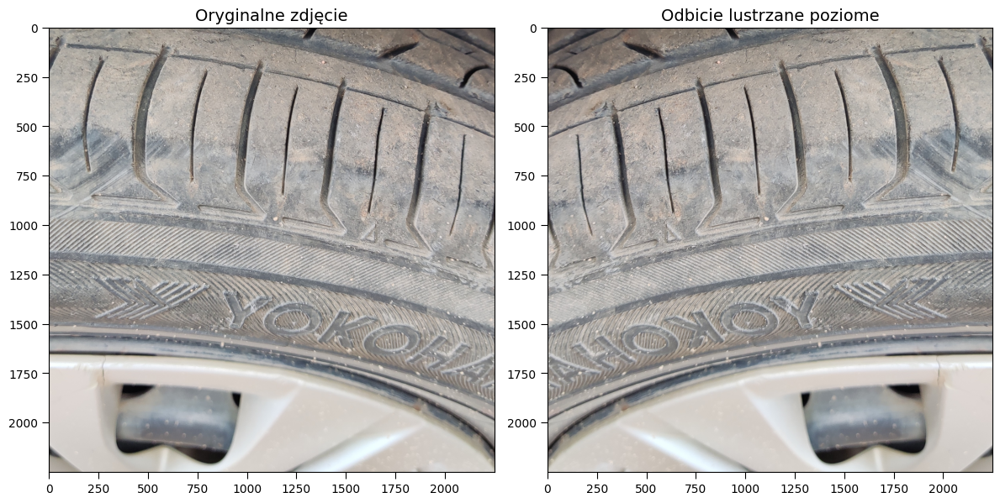

In [ ]:
flipped_image = flip_image(random_image, horizontal=True)
visualize_augmentation(random_image, flipped_image, title_original='Oryginalne zdjęcie', title_augmented='Odbicie lustrzane poziome')

### Zmiana jasności

Zmiana jasności obrazu może być przydatna, aby symulować różne warunki oświetleniowe

In [ ]:
from PIL import ImageEnhance

def adjust_brightness(image, factor):
    """
    Function to adjust the brightness of an image.

    Args:
    - image: The original image (PIL image).
    - factor: A float where 1.0 keeps the original brightness, <1.0 darkens the image, and >1.0 lightens the image.

    Returns:
    - The brightness-adjusted image.
    """
    enhancer = ImageEnhance.Brightness(image)
    return enhancer.enhance(factor)

In [ ]:
bright_image_1 = adjust_brightness(random_image, factor=1.5)
bright_image_2 = adjust_brightness(random_image, factor=0.7)

visualize_augmentation(random_image, bright_image_1, title_original='Oryginalne zdjęcie', title_augmented='Zwiększona jasność (x1.5)')
visualize_augmentation(random_image, bright_image_2, title_original='Oryginalne zdjęcie', title_augmented='Zmniejszona jasność (x0.7)')

### Szum (Noise Injection)

Dodanie szumu do obrazu symuluje zakłócenia, jakie mogą wystąpić w rzeczywistych warunkach.

In [ ]:
import numpy as np

def add_noise(image, noise_factor=0.2):
    """
    Function to add random noise to an image.

    Args:
    - image: The original image (PIL image).
    - noise_factor: Controls the intensity of the noise.

    Returns:
    - The image with added noise.
    """
    np_image = np.array(image)
    noise = np.random.normal(loc=0, scale=noise_factor, size=np_image.shape)
    noisy_image = np.clip(np_image + noise * 255, 0, 255).astype(np.uint8)
    return Image.fromarray(noisy_image)

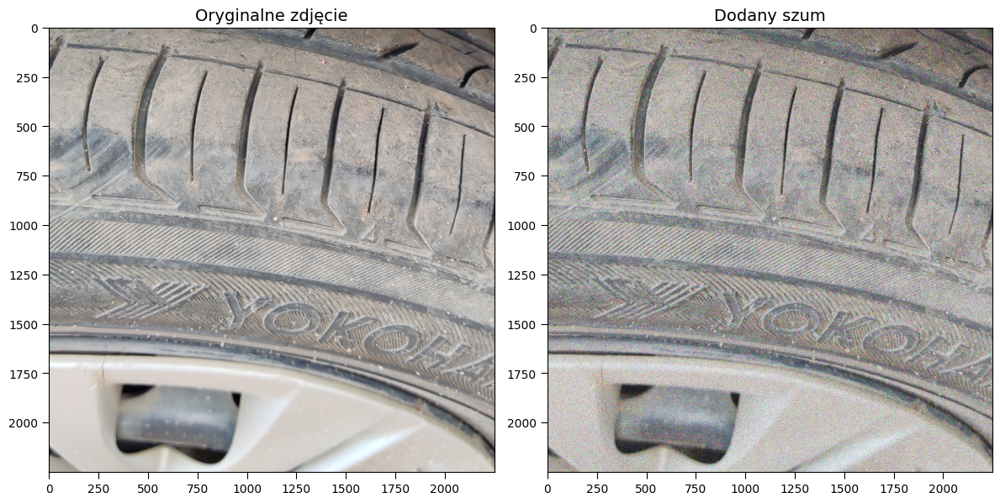

In [ ]:
noisy_image = add_noise(random_image, noise_factor=0.3)
visualize_augmentation(random_image, noisy_image, title_original='Oryginalne zdjęcie', title_augmented='Dodany szum')

### Zmiana kontrastu

Zmiana kontrastu obrazu może symulować różne warunki oświetleniowe i pozwala modelowi na lepsze generalizowanie w różnych warunkach.

In [ ]:
from PIL import ImageEnhance

def adjust_contrast(image, factor):
    """
    Function to adjust the contrast of an image.

    Args:
    - image: The original image (PIL image).
    - factor: A float where 1.0 keeps the original contrast, <1.0 reduces contrast, >1.0 increases contrast.

    Returns:
    - The contrast-adjusted image.
    """
    enhancer = ImageEnhance.Contrast(image)
    return enhancer.enhance(factor)


In [ ]:
contrast_image_1 = adjust_contrast(random_image, factor=1.5)  # Increase contrast
contrast_image_2 = adjust_contrast(random_image, factor=0.7)  # Decrease contrast

visualize_augmentation(random_image, contrast_image_1, title_original='Oryginalne zdjęcie', title_augmented='Zwiększony kontrast (x1.5)')
visualize_augmentation(random_image, contrast_image_2, title_original='Oryginalne zdjęcie', title_augmented='Zmniejszony kontrast (x0.7)')

### Gaussian Blur (Rozmycie)

 Rozmycie symuluje efekty defocusu, co może pomóc modelowi nauczyć się radzić sobie z nieostrymi obrazami, które mogą wystąpić w rzeczywistości.

In [ ]:
from PIL import ImageFilter

def blur_image(image, radius=2):
    return image.filter(ImageFilter.GaussianBlur(radius))

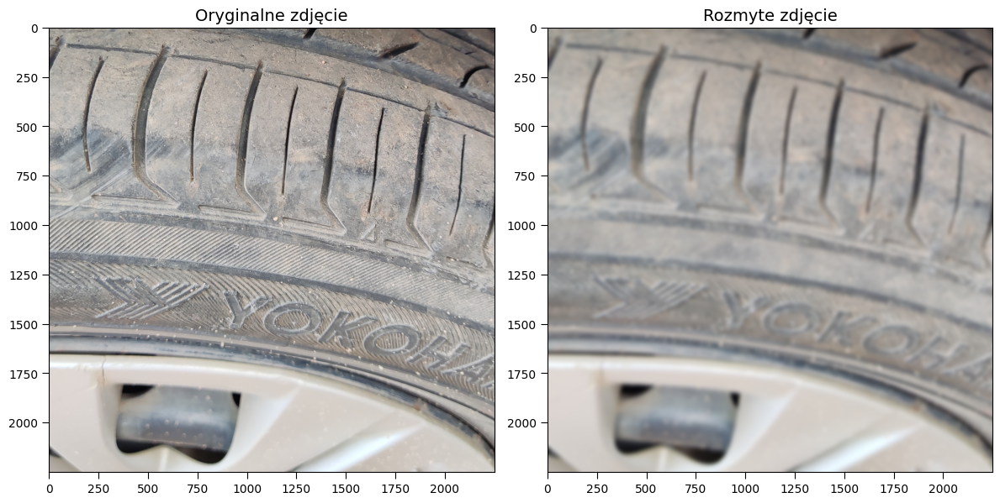

In [ ]:
blurred_image = blur_image(random_image, radius=9)

visualize_augmentation(random_image, blurred_image, title_augmented='Rozmyte zdjęcie')

### Zmiana nasycenia (Saturation Change)

In [ ]:
from PIL import ImageEnhance

def change_saturation(image, factor):
    enhancer = ImageEnhance.Color(image)
    return enhancer.enhance(factor)

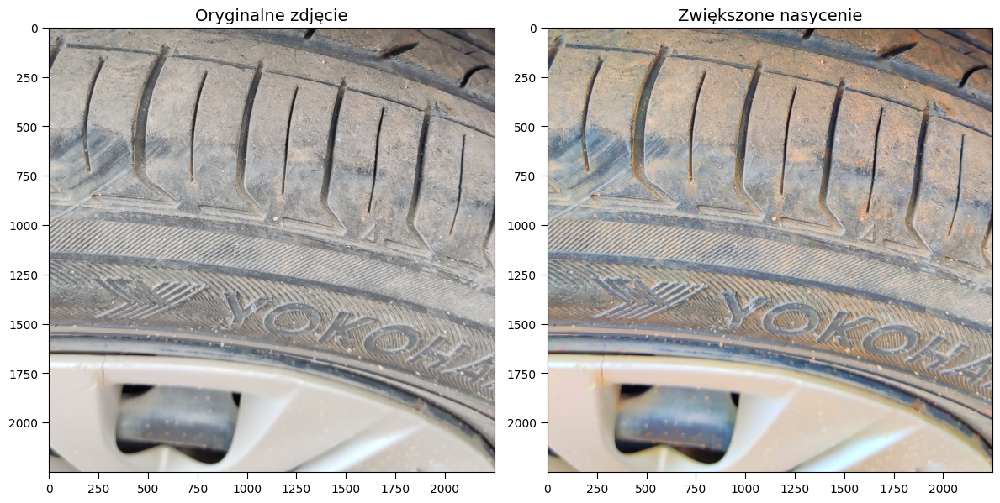

In [ ]:
saturated_image = change_saturation(random_image, 2.5)

visualize_augmentation(random_image, saturated_image, title_augmented='Zwiększone nasycenie')

### Zmiana odcienia (Hue Shift)

In [ ]:
import cv2

def shift_hue(image, hue_shift):
    image_np = np.array(image.convert('RGB'))
    hsv_image = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)
    hsv_image[..., 0] = (hsv_image[..., 0] + hue_shift) % 180
    shifted_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)
    return Image.fromarray(shifted_image)

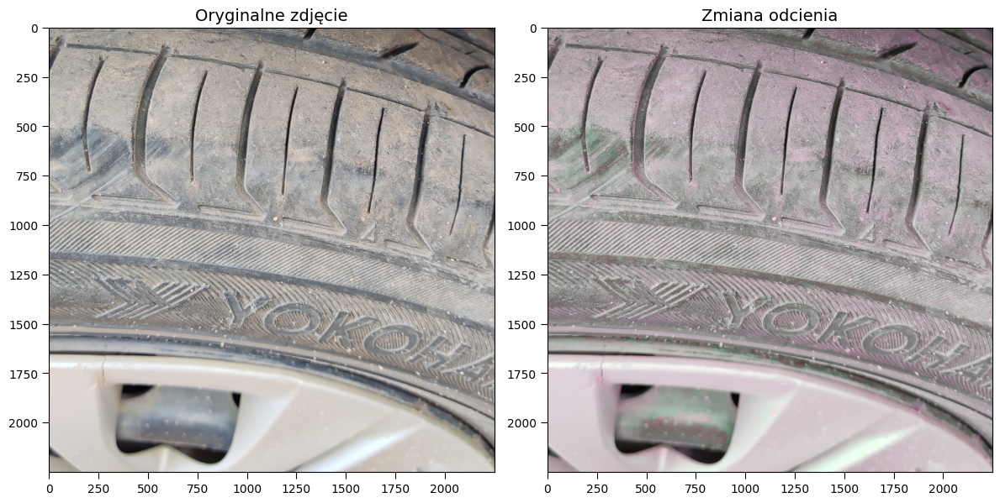

In [ ]:
hue_shifted_image = shift_hue(random_image, 150)

visualize_augmentation(random_image, hue_shifted_image, title_augmented='Zmiana odcienia')

### Przycięcie (Cropping)

In [ ]:
def crop_image(image, crop_box):
    return image.crop(crop_box)

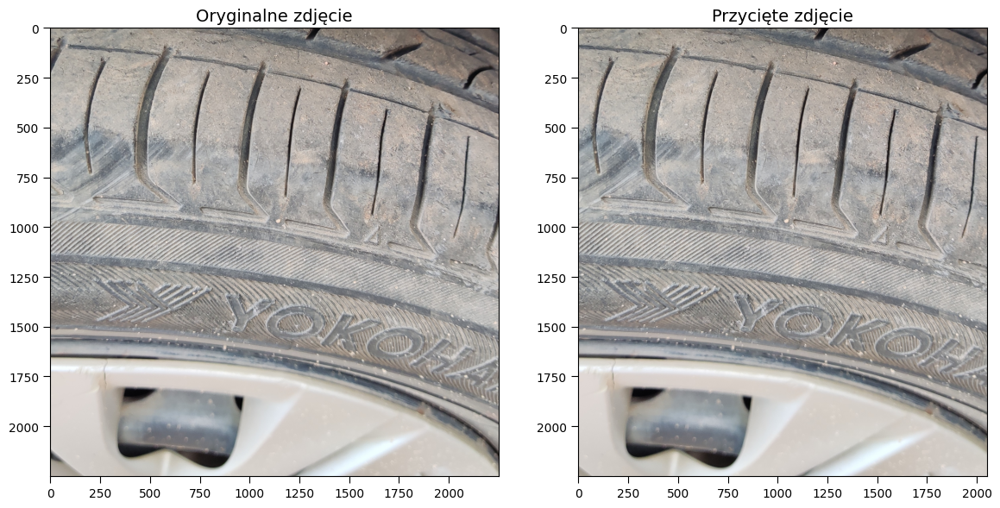

In [ ]:
crop_box = (100, 0, random_image.width - 100, random_image.height)
cropped_image = crop_image(random_image, crop_box)

visualize_augmentation(random_image, cropped_image, title_augmented='Przycięte zdjęcie')

### Skalowanie

In [ ]:
from PIL import Image

def scale_image(image, scale_factor):
    new_size = (int(image.width * scale_factor), int(image.height * scale_factor))
    return image.resize(new_size, Image.Resampling.LANCZOS)

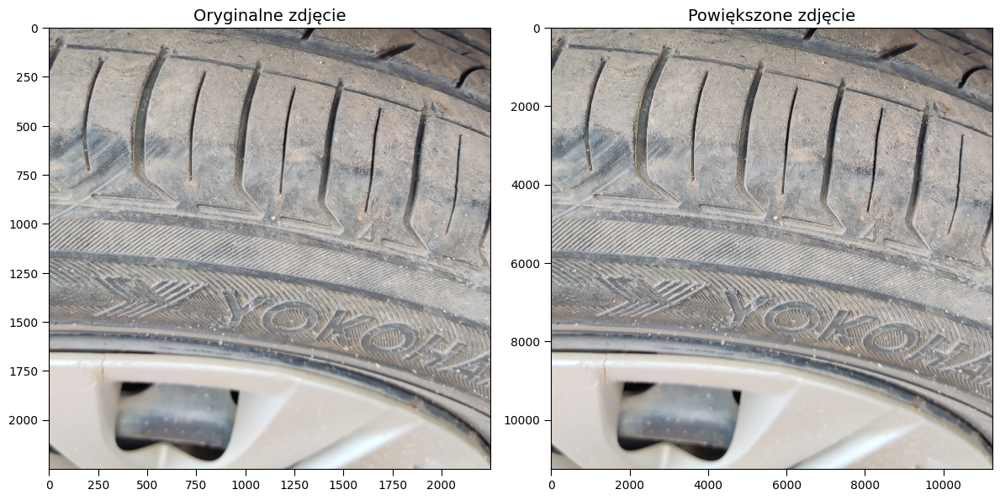

In [ ]:
scaled_image = scale_image(random_image, 5)

visualize_augmentation(random_image, scaled_image, title_augmented='Powiększone zdjęcie')

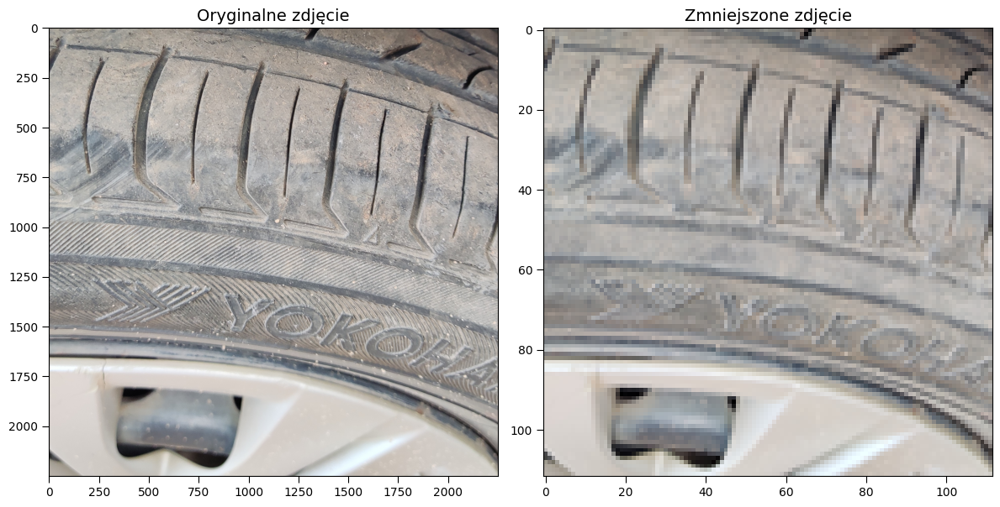

In [ ]:
scaled_image = scale_image(random_image, 0.05)

visualize_augmentation(random_image, scaled_image, title_augmented='Zmniejszone zdjęcie')

### Wycinanie fragmentu obrazu (Cutout)

In [ ]:
def cutout_image(image, mask_size=50):
    image_np = np.array(image)
    h, w = image_np.shape[:2]
    y = np.random.randint(h)
    x = np.random.randint(w)
    y1 = np.clip(y - mask_size // 2, 0, h)
    y2 = np.clip(y + mask_size // 2, 0, h)
    x1 = np.clip(x - mask_size // 2, 0, w)
    x2 = np.clip(x + mask_size // 2, 0, w)
    image_np[y1:y2, x1:x2] = 0  # Set the patch to black
    return Image.fromarray(image_np)

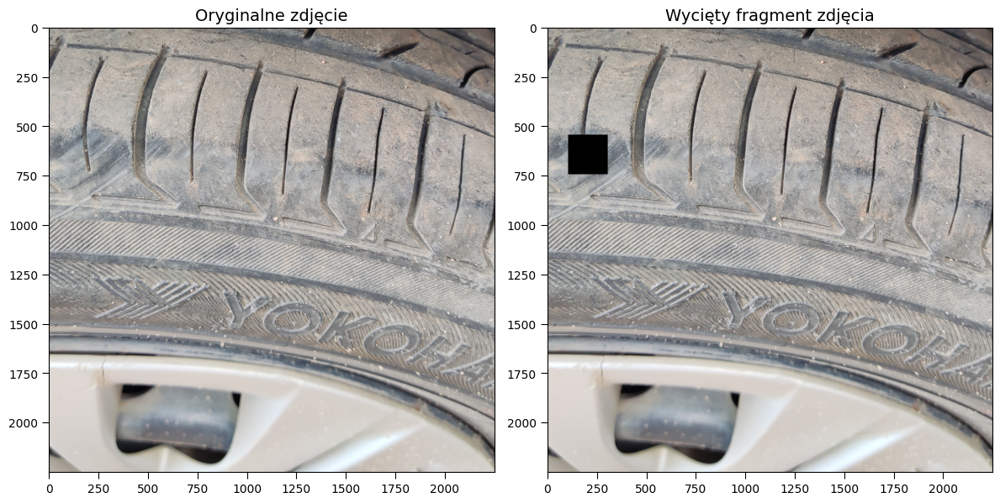

In [ ]:
cutout_image_augmented = cutout_image(random_image, 200)

# Visualize the original and cutout image
visualize_augmentation(random_image, cutout_image_augmented, title_augmented='Wycięty fragment zdjęcia')

### Przesunięcie kanałów kolorów

In [ ]:
def shift_color_channels(image, shift_value):
    image_np = np.array(image)
    image_np = np.roll(image_np, shift_value, axis=-1)
    return Image.fromarray(image_np)

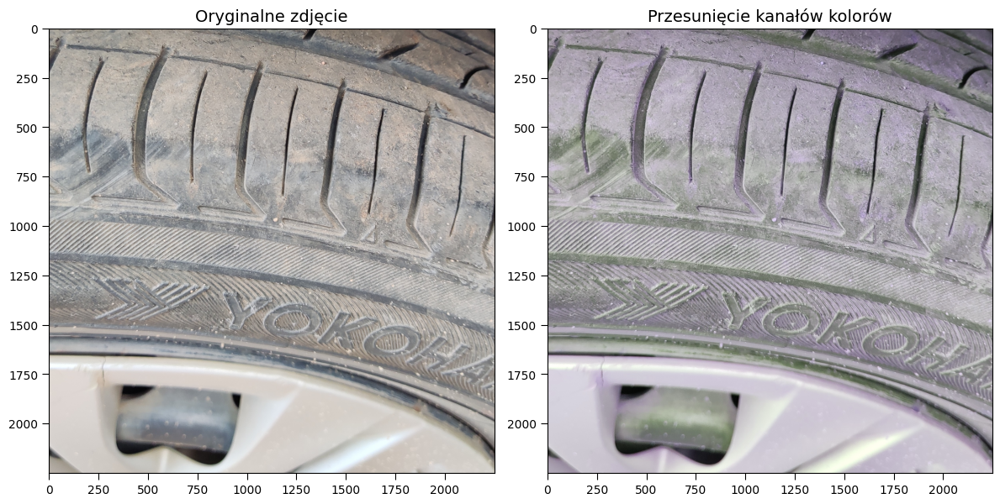

In [ ]:
channel_shifted_image = shift_color_channels(random_image, 50)

visualize_augmentation(random_image, channel_shifted_image, title_augmented='Przesunięcie kanałów kolorów')

## Narzedzia do zarządzania, trenowania i oceny modeli

In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import os


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import os

def train_model(model, train_generator, val_generator, epochs=10, save_folder='/content/drive/My Drive/Magisterka/Models',
                save_filename='best_model.keras'):
    """
    Trains the model with early stopping, learning rate reduction, and saves the best model.

    Parameters:
    - model: The compiled Keras model to train.
    - train_generator: Data generator for training data.
    - val_generator: Data generator for validation data.
    - epochs: Number of epochs to train for (default is 10).
    - save_folder: Directory where the model will be saved (default is '/content/drive/My Drive/Magisterka/Models').
    - save_filename: Name of the saved model file (default is 'best_model.keras').

    Returns:
    - history: Training history returned by model.fit().
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model
    save_path = os.path.join(save_folder, save_filename)

    # Early stopping to prevent overfitting
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    learning_rate_reduction = ReduceLROnPlateau(monitor="val_loss", patience=2, factor=0.5, min_lr=0.00001, verbose=1)

    # Checkpoint to save the best model
    checkpoint = ModelCheckpoint(save_path, monitor='val_loss', save_best_only=True, verbose=1)

    # Train the model using the generators
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=epochs,
        callbacks=[early_stopping, learning_rate_reduction, checkpoint],
        verbose=1
    )

    return history


In [ ]:
import os
import tensorflow as tf

def save_model(model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='final_model'):
    """
    Saves the trained model to the specified folder and filename.

    Parameters:
    - model: Trained Keras model to save.
    - save_folder: Directory where the model will be saved (default is '/content/drive/My Drive/Magisterka/Models').
    - save_filename: Name of the saved model file (without extension for TensorFlow SavedModel, with .keras or .h5 for other formats).
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model
    save_path = os.path.join(save_folder, save_filename)

    # Save the model based on the file extension or as SavedModel
    if save_filename.endswith('.keras') or save_filename.endswith('.h5'):
        model.save(save_path)  # Save as .keras or .h5 depending on the filename extension
    else:
        model.save(save_path)  # Save as TensorFlow SavedModel (no extension)

    print(f"Model saved to {save_path}")


In [ ]:
def convert_to_tflite(model):
    """
    Converts the Keras model to TensorFlow Lite format and returns the TFLite model.

    Parameters:
    - model: Trained Keras model to convert.

    Returns:
    - tflite_model: The converted TensorFlow Lite model in byte format.
    """
    # Convert the Keras model to TensorFlow Lite format
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    tflite_model = converter.convert()

    print("Model successfully converted to TensorFlow Lite format.")

    return tflite_model

In [ ]:
import os

def save_tflite_model(tflite_model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='final_model.tflite'):
    """
    Saves the TensorFlow Lite model to the specified folder and filename.

    Parameters:
    - tflite_model: Converted TensorFlow Lite model in byte format.
    - save_folder: Directory where the TFLite model will be saved.
    - save_filename: Name of the saved TFLite model file.
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the TFLite model
    save_path = os.path.join(save_folder, save_filename)

    # Save the TFLite model
    with open(save_path, 'wb') as f:
        f.write(tflite_model)

    print(f"TensorFlow Lite model saved to {save_path}")


In [ ]:
def evaluate_model(model, test_generator):
    """
    Evaluates the trained model on the test set and returns loss and accuracy in a dictionary.

    Parameters:
    - model: The trained Keras model to evaluate.
    - test_generator: Generator for test data.

    Returns:
    - results: Dictionary containing 'loss' and 'accuracy' from the evaluation.
    """
    # Ocena modelu na zbiorze testowym przy użyciu generatora
    loss, accuracy = model.evaluate(test_generator, verbose=1)

    # Wyświetlenie wyników
    print(f"Test Loss: {loss}")
    print(f"Test Accuracy: {accuracy}")

    # Zwróć wyniki jako słownik
    return {'loss': loss, 'accuracy': accuracy}


In [ ]:
def export_saved_model(model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='saved_model'):
    """
    Exports the trained model as a TensorFlow SavedModel format.

    Parameters:
    - model: Trained Keras model to export.
    - save_folder: Directory where the model will be saved (default is '/content/drive/My Drive/Magisterka/Models').
    - save_filename: Name of the saved model directory (no extension required for SavedModel).
    """
    # Ensure the save folder exists
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    # Full save path for the model (no extension needed for SavedModel)
    save_path = os.path.join(save_folder, save_filename)

    # Export the model as a TensorFlow SavedModel
    tf.saved_model.save(model, save_path)
    print(f"Model exported to {save_path} as TensorFlow SavedModel.")

In [ ]:
def test_tflite_model(tflite_model_path, input_data):
    """
    Tests the converted TensorFlow Lite model with given input data.

    Parameters:
    - tflite_model_path: Path to the TensorFlow Lite model file.
    - input_data: Preprocessed input data for inference.

    Returns:
    - predictions: Output from the TensorFlow Lite model.
    """
    # Load the TensorFlow Lite model
    interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
    interpreter.allocate_tensors()

    # Get input and output details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Preprocess the input data to match the input tensor shape
    input_shape = input_details[0]['shape']
    input_data = input_data.reshape(input_shape).astype('float32')

    # Set the tensor input data
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run the inference
    interpreter.invoke()

    # Get the output predictions
    predictions = interpreter.get_tensor(output_details[0]['index'])

    print("TFLite model inference completed.")
    return predictions


## Modele


In [ ]:
# Importing necessary libraries and modules
import warnings  # Import the 'warnings' module for handling warnings
warnings.filterwarnings("ignore")  # Ignore warnings during execution

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import tensorflow as tf

import torch  # Import PyTorch for deep learning
from torch.utils.data import DataLoader  # For creating data loaders
from torchvision.transforms import (  # Import image transformation functions
    CenterCrop,  # Center crop an image
    Compose,  # Compose multiple image transformations
    Normalize,  # Normalize image pixel values
    RandomRotation,  # Apply random rotation to images
    RandomResizedCrop,  # Crop and resize images randomly
    RandomHorizontalFlip,  # Apply random horizontal flip
    RandomAdjustSharpness,  # Adjust sharpness randomly
    Resize,  # Resize images
    ToTensor  # Convert images to PyTorch tensors
)

### EfficientNets

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, Model

# Build the EfficientNetB0 model
base_model = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base layers

# Add classification layers
inputs = layers.Input(shape=(224, 224, 3))  # Define the input
x = base_model(inputs, training=False)  # Pass the input through the base model
x = layers.GlobalAveragePooling2D()(x)  # Apply global average pooling
x = layers.Dense(256, activation='relu')(x)  # Add a dense layer
outputs = layers.Dense(1, activation='sigmoid')(x)  # Output layer with sigmoid activation

# Final model
model_efficientnet = Model(inputs, outputs)

# Compile the model
model_efficientnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model structure
model_efficientnet.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,377,764 (16.70 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
# Train the EfficientNetB0 model
history_efficientnet = train_model(
    model_efficientnet,
    X_train, y_train,
    X_val, y_val,
    epochs=10,
    batch_size=32,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='efficientnet_best_model.keras'
)

# Save the final EfficientNetB0 model
save_model(
    model_efficientnet,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='efficientnet_final_model.keras'
)

# Evaluate the model on the test set
evaluate_model(model_efficientnet, X_test, y_test)

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 631ms/step - accuracy: 0.5143 - loss: 0.7034
Epoch 1: val_loss improved from inf to 0.69242, saving model to /content/drive/My Drive/Magisterka/Models/efficientnet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 75s 824ms/step - accuracy: 0.5145 - loss: 0.7034 - val_accuracy: 0.5360 - val_loss: 0.6924
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 624ms/step - accuracy: 0.5325 - loss: 0.6925
Epoch 2: val_loss improved from 0.69242 to 0.69095, saving model to /content/drive/My Drive/Magisterka/Models/efficientnet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 59s 771ms/step - accuracy: 0.5325 - loss: 0.6925 - val_accuracy: 0.5360 - val_loss: 0.6910
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 629ms/step - accuracy: 0.5419 - loss: 0.6902
Epoch 3: val_loss improved from 0.69095 to 0.69055, saving model to /content/drive/My Drive/Magisterka/Models/efficientnet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 60s 775ms/step - accuracy: 0.5419 - loss: 0.6902 - val_accuracy

[0.6978004574775696, 0.4829545319080353]

### MobileNet

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model

# Zbudowanie modelu MobileNetV2
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Zamrożenie warstw bazowych

# Dodanie warstw klasyfikacyjnych
inputs = layers.Input(shape=(224, 224, 3))  # Zdefiniowanie wejścia
x = base_model(inputs, training=False)  # Przekazanie wejścia do modelu bazowego
x = layers.GlobalAveragePooling2D()(x)  # Global average pooling
x = layers.Dense(256, activation='relu')(x)  # Warstwa gęsta
outputs = layers.Dense(1, activation='sigmoid')(x)  # Wyjście

# Ostateczny model
model = Model(inputs, outputs)

# Kompilacja modelu
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Wyświetlenie modelu
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,586,177 (9.87 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Generator dla zbioru treningowego z augmentacją
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)

# Generator dla zbioru walidacyjnego bez augmentacji, tylko skalowanie
val_datagen = ImageDataGenerator(
    rescale=1.0/255.0
)

# Generator dla zbioru testowego bez augmentacji, tylko skalowanie
test_datagen = ImageDataGenerator(
    rescale=1.0/255.0
)

In [ ]:
batch_size = 32

train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)
val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(
    model,
    train_generator,
    val_generator,
    epochs=40,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='mobilenet_best_model.keras'
)

Epoch 1/40
76/77 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.7560 - loss: 0.5461
Epoch 1: val_loss improved from inf to 0.23045, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 34s 336ms/step - accuracy: 0.7581 - loss: 0.5419 - val_accuracy: 0.9110 - val_loss: 0.2304 - learning_rate: 0.0010
Epoch 2/40
76/77 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.8945 - loss: 0.2419
Epoch 2: val_loss improved from 0.23045 to 0.21886, saving model to /content/drive/My Drive/Magisterka/Models/mobilenet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 24s 282ms/step - accuracy: 0.8946 - loss: 0.2421 - val_accuracy: 0.9167 - val_loss: 0.2189 - learning_rate: 0.0010
Epoch 3/40
76/77 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9112 - loss: 0.2255
Epoch 3: val_loss did not improve from 0.21886
77/77 ━━━━━━━━━━━━━━━━━━━━ 23s 270ms/step - accuracy: 0.9111 - loss: 0.2256 - val_accuracy: 0.8902 - val_loss: 0.2440 - learning_rate: 0.0010

In [ ]:
results = evaluate_model(model, test_generator=test_generator)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9495 - loss: 0.1481
Test Loss: 0.15772555768489838
Test Accuracy: 0.9431818127632141


In [ ]:
# Convert the Keras model to TensorFlow Lite
tflite_model = convert_to_tflite(model)

Saved artifact at '/tmp/tmp9td331th'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  132693138802816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132698868225600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132698868222784: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132698868229648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132698868228768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132692945159088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132692945159616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132692945163136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132692945160672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132692945161024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1326929451

In [ ]:
# Save the TFLite model
save_tflite_model(tflite_model, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='mobilenet_final_model.tflite')

TensorFlow Lite model saved to /content/drive/My Drive/Magisterka/Models/mobilenet_final_model.tflite


In [ ]:
tflite_model_path = '/content/drive/My Drive/Magisterka/Models/mobilenet_final_model.tflite'
predictions = test_tflite_model(tflite_model_path, X_test[0])

print(f'TFLite model predictions: {predictions}')

TFLite model inference completed.
TFLite model predictions: [[0.99753994]]


### NasNetMobile

In [ ]:
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras import layers, Model

# Build the NasNetMobile model
base_model = NASNetMobile(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base layers

# Add classification layers
inputs = layers.Input(shape=(224, 224, 3))  # Define the input
x = base_model(inputs, training=False)  # Pass the input through the base model
x = layers.GlobalAveragePooling2D()(x)  # Apply global average pooling
x = layers.Dense(256, activation='relu')(x)  # Add a dense layer
outputs = layers.Dense(1, activation='sigmoid')(x)  # Output layer with sigmoid activation

# Final model
model_nasnet = Model(inputs, outputs)

# Compile the model
model_nasnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model structure
model_nasnet.summary()

19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ nasnet_mobile (Functional)           │ (None, 7, 7, 1056)          │       4,269,716 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1056)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         270,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,540,565 (17.32 MB)

 Trainable params: 270,849 (1.03 MB)

 Non-trainable params: 4,269,716 (16.29 MB)

In [ ]:
# Train the NasNetMobile model
history_nasnet = train_model(
    model_nasnet,
    X_train, y_train,
    X_val, y_val,
    epochs=10,
    batch_size=32,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='nasnet_best_model.keras'
)

# Save the final NasNetMobile model
save_model(
    model_nasnet,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='nasnet_final_model.keras'
)

# Evaluate the model on the test set
evaluate_model(model_nasnet, X_test, y_test)

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 569ms/step - accuracy: 0.9983 - loss: 0.0242
Epoch 1: val_loss improved from inf to 0.22993, saving model to /content/drive/My Drive/Magisterka/Models/nasnet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 57s 737ms/step - accuracy: 0.9983 - loss: 0.0242 - val_accuracy: 0.9072 - val_loss: 0.2299
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 621ms/step - accuracy: 0.9992 - loss: 0.0157
Epoch 2: val_loss did not improve from 0.22993
77/77 ━━━━━━━━━━━━━━━━━━━━ 58s 752ms/step - accuracy: 0.9992 - loss: 0.0157 - val_accuracy: 0.9148 - val_loss: 0.2581
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - accuracy: 1.0000 - loss: 0.0125
Epoch 3: val_loss did not improve from 0.22993
77/77 ━━━━━━━━━━━━━━━━━━━━ 55s 712ms/step - accuracy: 1.0000 - loss: 0.0125 - val_accuracy: 0.9072 - val_loss: 0.2418
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - accuracy: 0.9998 - loss: 0.0089
Epoch 4: val_loss did not improve from 0.22993
77/77 ━━━━━━━━━━━━━━━━━━━━ 53s 

[0.2812548279762268, 0.9109848737716675]

### SqueezeNet

In [ ]:
!wget https://raw.githubusercontent.com/cmasch/squeezenet/master/squeezenet.py

--2024-10-14 17:54:58--  https://raw.githubusercontent.com/cmasch/squeezenet/master/squeezenet.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5385 (5.3K) [text/plain]
Saving to: ‘squeezenet.py’

squeezenet.py       100%[===================>]   5.26K  --.-KB/s    in 0s      

2024-10-14 17:54:59 (82.3 MB/s) - ‘squeezenet.py’ saved [5385/5385]



In [ ]:
from squeezenet import SqueezeNet, SqueezeNet_11

# Version 1.0
model = SqueezeNet(input_shape=(224, 224, 3), nb_classes=1, use_bypass=True)  # Dostosuj nb_classes do Twojego problemu
model.summary()

# Możesz teraz trenować model podobnie jak inne modele
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Wyświetlenie modelu
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1 (Conv2D)            │ (None, 112, 112, 96)   │         14,208 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ maxpool1 (MaxPooling2D)   │ (None, 55, 55, 96)     │              0 │ conv1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_squeeze (Conv2D)    │ (None, 55, 55, 16)     │          1,552 │ maxpool1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_expand_1x1 (Conv2D) │ (None, 55, 55, 64)     │          1,088 │ fire2_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_expand_3x3 (Conv2D) │ (None, 55, 55, 64)     │          9,280 │ fire2_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_concatenate         │ (None, 55, 55, 128)    │              0 │ fire2_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire2_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_squeeze (Conv2D)    │ (None, 55, 55, 16)     │          2,064 │ fire2_concatenate[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_expand_1x1 (Conv2D) │ (None, 55, 55, 64)     │          1,088 │ fire3_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_expand_3x3 (Conv2D) │ (None, 55, 55, 64)     │          9,280 │ fire3_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_concatenate         │ (None, 55, 55, 128)    │              0 │ fire3_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire3_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_concatenate_bypass  │ (None, 55, 55, 128)    │              0 │ fire3_concatenate[0][… │
│ (Add)                     │                        │                │ fire2_concatenate[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_squeeze (Conv2D)    │ (None, 55, 55, 32)     │          4,128 │ fire3_concatenate_byp… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_expand_1x1 (Conv2D) │ (None, 55, 55, 128)    │          4,224 │ fire4_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_expand_3x3 (Conv2D) │ (None, 55, 55, 128)    │         36,992 │ fire4_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_concatenate         │ (None, 55, 55, 256)    │              0 │ fire4_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire4_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ maxpool4 (MaxPooling2D)   │ (None, 27, 27, 256)    │              0 │ fire4_concatenate[0][… │
├──────────────────────

 Total params: 735,937 (2.81 MB)

 Trainable params: 735,937 (2.81 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1 (Conv2D)            │ (None, 112, 112, 96)   │         14,208 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ maxpool1 (MaxPooling2D)   │ (None, 55, 55, 96)     │              0 │ conv1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_squeeze (Conv2D)    │ (None, 55, 55, 16)     │          1,552 │ maxpool1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_expand_1x1 (Conv2D) │ (None, 55, 55, 64)     │          1,088 │ fire2_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_expand_3x3 (Conv2D) │ (None, 55, 55, 64)     │          9,280 │ fire2_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire2_concatenate         │ (None, 55, 55, 128)    │              0 │ fire2_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire2_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_squeeze (Conv2D)    │ (None, 55, 55, 16)     │          2,064 │ fire2_concatenate[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_expand_1x1 (Conv2D) │ (None, 55, 55, 64)     │          1,088 │ fire3_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_expand_3x3 (Conv2D) │ (None, 55, 55, 64)     │          9,280 │ fire3_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_concatenate         │ (None, 55, 55, 128)    │              0 │ fire3_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire3_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire3_concatenate_bypass  │ (None, 55, 55, 128)    │              0 │ fire3_concatenate[0][… │
│ (Add)                     │                        │                │ fire2_concatenate[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_squeeze (Conv2D)    │ (None, 55, 55, 32)     │          4,128 │ fire3_concatenate_byp… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_expand_1x1 (Conv2D) │ (None, 55, 55, 128)    │          4,224 │ fire4_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_expand_3x3 (Conv2D) │ (None, 55, 55, 128)    │         36,992 │ fire4_squeeze[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ fire4_concatenate         │ (None, 55, 55, 256)    │              0 │ fire4_expand_1x1[0][0… │
│ (Concatenate)             │                        │                │ fire4_expand_3x3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ maxpool4 (MaxPooling2D)   │ (None, 27, 27, 256)    │              0 │ fire4_concatenate[0][… │
├──────────────────────

 Total params: 735,937 (2.81 MB)

 Trainable params: 735,937 (2.81 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = train_model(
    model,
    X_train, y_train,
    X_val, y_val,
    epochs=10,
    batch_size=32,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='squeezenet_best_model.keras'
)

# Zapisanie ostatecznego modelu
save_model(
    model,
    save_folder='/content/drive/My Drive/Magisterka/Models',
    save_filename='squeezenet_final_model.keras'
)

# Ocena na zbiorze testowym
evaluate_model(model, X_test, y_test)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5458 - loss: 0.6951
Epoch 1: val_loss improved from inf to 0.69087, saving model to /content/drive/My Drive/Magisterka/Models/squeezenet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.5457 - loss: 0.6951 - val_accuracy: 0.5360 - val_loss: 0.6909
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5421 - loss: 0.6902
Epoch 2: val_loss improved from 0.69087 to 0.69056, saving model to /content/drive/My Drive/Magisterka/Models/squeezenet_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 100s 1s/step - accuracy: 0.5421 - loss: 0.6902 - val_accuracy: 0.5360 - val_loss: 0.6906
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5519 - loss: 0.6886
Epoch 3: val_loss did not improve from 0.69056
77/77 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - accuracy: 0.5517 - loss: 0.6886 - val_accuracy: 0.5360 - val_loss: 0.6906
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5496 - loss: 0.6885
Epoch 4: val_

[0.698187530040741, 0.4829545319080353]

### ShuffleNet

### ResNet50


In [ ]:
# Create base model with tf.keras.applications
base_model_resnet50 =tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')

# Freeze the base model (so the pre-learned patterns remain same)
base_model_resnet50.trainable = False


# Create inputs into the base model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_resnet50(inputs)

# Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)


x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
#x=tf.keras.layers.Dropout(0.5)(x)

# Create the output activation layer
outputs=tf.keras.layers.Dense(1, activation="sigmoid",name="output_layer")(x)

# Combine the inputs with the outputs into a model
model_resnet50 = tf.keras.Model(inputs, outputs, name="model")

In [ ]:
model_resnet50.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_resnet50.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,637,313 (93.98 MB)

 Trainable params: 1,049,601 (4.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Generator dla zbioru treningowego z augmentacją, bez normalizacji
train_datagen = ImageDataGenerator(
    rotation_range=90,
    shear_range=0.2,
    horizontal_flip=True
)

# Generator dla zbioru walidacyjnego bez augmentacji i bez normalizacji
val_datagen = ImageDataGenerator()

# Generator dla zbioru testowego bez augmentacji i bez normalizacji
test_datagen = ImageDataGenerator()

In [ ]:
batch_size = 32

train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)
val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size)

In [ ]:
history = train_model(model_resnet50,
                      train_generator,
                      val_generator,
                      epochs=80,
                      save_folder='/content/drive/My Drive/Magisterka/Models',
                      save_filename='resnet50_best_model.keras')

Epoch 1/80
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - accuracy: 0.8119 - loss: 0.5452
Epoch 1: val_loss improved from inf to 0.19807, saving model to /content/drive/My Drive/Magisterka/Models/resnet50_best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 39s 376ms/step - accuracy: 0.8125 - loss: 0.5429 - val_accuracy: 0.9167 - val_loss: 0.1981 - learning_rate: 0.0010
Epoch 2/80
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9095 - loss: 0.2208
Epoch 2: val_loss did not improve from 0.19807
77/77 ━━━━━━━━━━━━━━━━━━━━ 24s 287ms/step - accuracy: 0.9096 - loss: 0.2208 - val_accuracy: 0.9053 - val_loss: 0.2145 - learning_rate: 0.0010
Epoch 3/80
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9241 - loss: 0.1846
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_loss did not improve from 0.19807
77/77 ━━━━━━━━━━━━━━━━━━━━ 24s 279ms/step - accuracy: 0.9242 - loss: 0.1845 - val_accuracy: 0.9223 - val_loss: 0.2077 - learning_rate: 0.0010
Epoch 4/80
77

In [ ]:
evaluate_model(model_resnet50, test_generator)

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - accuracy: 0.9588 - loss: 0.1017
Test Loss: 0.10448069125413895
Test Accuracy: 0.9526515007019043


{'loss': 0.10448069125413895, 'accuracy': 0.9526515007019043}

### ResNet101

In [ ]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam


base_model_resnet101 = ResNet101(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model_resnet101.trainable = False  # Zamrożenie warstw bazowych

# Dodanie własnych warstw klasyfikacyjnych
model_resnet101 = Sequential([
    layers.InputLayer(input_shape=(224, 224, 3)),
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(1, activation='sigmoid')
])

# Kompilacja modelu
model_resnet101.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Wyświetlenie modelu
model_resnet101.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │           2,049 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,589,761 (89.99 MB)

 Trainable params: 2,049 (8.00 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
history = train_model(model_resnet101, X_train, y_train, X_val, y_val, epochs=20, batch_size=64, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='resnet101_best_model.keras')


NameError: name 'model_resnet101' is not defined

In [ ]:
# Zapis ostatecznego modelu
save_model(model_resnet101, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='resnet101_final_model.keras')

Model saved to /content/drive/My Drive/Magisterka/Models/resnet101_final_model.keras


In [ ]:
export_saved_model(model_resnet101, save_folder='/content/drive/My Drive/Magisterka/Models', save_filename='resnet101_final_model')

Model exported to /content/drive/My Drive/Magisterka/Models/resnet101_final_model as TensorFlow SavedModel.


In [ ]:
# Ocena na zbiorze testowym
evaluate_model(model_resnet101, X_test, y_test)

17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.6362 - loss: 0.6387
Test Loss: 0.6418601870536804
Test Accuracy: 0.6212121248245239


[0.6418601870536804, 0.6212121248245239]

### VGG


### Inception (GoogleLeNet)


### DenseNet

### Sth else

### ViT (Vision Transformer)


In [ ]:
!pip install -U -q evaluate transformers datasets>=2.14.5 accelerate>=0.27 mlflow 2>/dev/null

In [ ]:
from transformers import (  # Import various modules from the Transformers library
    TrainingArguments,  # For training arguments
    Trainer,  # For model training
    ViTImageProcessor,  # For processing image data with ViT models
    ViTForImageClassification,  # ViT model for image classification
    DefaultDataCollator  # For collating data in the default way
)

In [ ]:
# Define the ViT model
base_model_vit = TFViTModel.from_pretrained('google/vit-base-patch16-224-in21k')

# Freeze the base model layers
base_model_vit.trainable = False

# Build the custom classification head
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model_vit.vit(inputs)['last_hidden_state']
x = tf.keras.layers.GlobalAveragePooling1D()(x)
x = tf.keras.layers.Dense(512, activation="relu")(x)
outputs = tf.keras.layers.Dense(1, activation="sigmoid")(x)

# Combine inputs and outputs into a model
model_vit = tf.keras.Model(inputs=inputs, outputs=outputs, name="model_vit")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


ValueError: Exception encountered when calling layer 'vit' (type TFViTMainLayer).

Data of type <class 'keras.src.backend.common.keras_tensor.KerasTensor'> is not allowed only (<class 'tensorflow.python.framework.tensor.Tensor'>, <class 'bool'>, <class 'int'>, <class 'transformers.utils.generic.ModelOutput'>, <class 'tuple'>, <class 'list'>, <class 'dict'>, <class 'numpy.ndarray'>) is accepted for pixel_values.

Call arguments received by layer 'vit' (type TFViTMainLayer):
  • pixel_values=<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=input_layer>
  • head_mask=None
  • output_attentions=None
  • output_hidden_states=None
  • interpolate_pos_encoding=None
  • return_dict=None
  • training=False

In [ ]:
model_vit.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


NameError: name 'model_vit' is not defined

### ConvNext

## Mobile - Firebase ML Kit

In [ ]:
!pip install tensorflowjs

In [ ]:
import tensorflowjs as tfjs

def convert_savedmodel_to_tfjs(saved_model_path, output_path='tfjs_model'):
    """
    Converts a TensorFlow SavedModel to TensorFlow.js format and saves it to the specified output path.

    Parameters:
    saved_model_path (str): The path to the directory containing the SavedModel.
    output_path (str): The directory where the converted TensorFlow.js model will be saved.
    """
    # Convert the SavedModel to TensorFlow.js format
    tfjs.converters.convert_tf_saved_model(saved_model_path, output_path)

    print(f"Model successfully converted to TensorFlow.js format and saved in {output_path}")


In [ ]:
# Path to your already saved SavedModel
saved_model_path = '/content/drive/My Drive/Magisterka/Models/resnet101_final_model'

# Convert the SavedModel to TensorFlow.js format and save it in 'tfjs_model' directory
convert_savedmodel_to_tfjs(saved_model_path, output_path='/content/drive/My Drive/Magisterka/Models/resnet101_final_model_tfjs')

Model successfully converted to TensorFlow.js format and saved in /content/drive/My Drive/Magisterka/Models/resnet101_final_model_tfjs


### Another


## Inne
